# Chapter 4.2.1. Visual analysis of daily average load profiles on community-level

In the following JupyterNotebook sections, the code to plot the figures analyzed in chapter 4.2.1. is provided.

#### Utility Functions

In [1]:
"""
Utility function to calculate the average load profiles for all households of a community and concat
them side-by-side to enable comparative plotting
@param hh: input household load profiles 
@param simulation: community household IDs with corresponding target
@return: merged average load profiles for each community 
"""
def merge_community_load_profiles(hh, simulation):
    
    # Calculate the average load profiles for the given set of households
    hh_av = hh.groupby(hh.index.droplevel('Day').map(lambda idx : idx.time())).mean().T
    hh_av.columns = range(1,49)
    
    # Define the columns of the merged DataFrame: each timestep of each household type
    columns = []
    hh_types = simulation.columns[:5]
    for h in hh_types:
        for t in range(1,49):
            columns.append('{}-{}'.format(h,t))
    
    # Merge the average load profiles of all households in each community
    result = pd.DataFrame(index=sim.index, columns=columns)
    # For each community...
    for community in sim.index:
        # and for each household type within the communities...
        for hh_type in hh_types:
            hh_id = sim.loc[community,hh_type]
            # get each timestep and transfer it into the new DataFrame 
            for t in range(1,49):
                result.loc[community, '{}-{}'.format(hh_type,t)] = hh_av.loc[hh_id, t]
    
    # Add each communities corresponding class
    result['CommunityProfit_Class'] = sim['CommunityProfit_Class']
    
    return result 

"""
Plot the average load profiles 
"""
def plot_community_load_profiles(communities, title):
    plt.figure(figsize=(30,10), dpi=500)
    communities[communities['CommunityProfit_Class']=='Low'].mean(axis='rows').plot.line(label='Low', linewidth=3)
    communities[communities['CommunityProfit_Class']=='High'].mean(axis='rows').plot.line(label='High', linewidth=3)
    plt.legend(loc='upper left', fontsize='xx-large')
    plt.xticks(ticks=[(24+48*i) for i in range(0,5)], labels=['Battery/PV_1', 'Battery/PV_2', 'PV', 'Consumer_1', 'Consumer_2'], fontsize='xx-large')
    plt.xlabel('Household Type', fontsize='xx-large')
    plt.xlim(0,5*48)
    plt.yticks(fontsize='xx-large')
    plt.ylabel('Normalized Load', fontsize='xx-large')
    plt.grid(True)
    plt.title(label=title, loc='center', fontdict={'fontsize':'xx-large'})
    for i in range(1,6):
        plt.axvline(i*48, color='gray', linewidth=3)
    plt.show()

#### Data Preprocessing

In [499]:
# Import required Python modules
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from datetime import datetime
import time

start_time = time.time()

# Import the household and simulation datasets:
hh = pd.read_pickle('Data/households_cleaned_2016_simulation_normalized.pkl')
sim = pd.read_pickle('Data/Simulation_Results.pkl')

# Prepare the Data Subsets for seasons and work-/weekend-days:
workdays = [0,1,2,3,4]
weekend = [5,6]
spring = [4,5,10,11]
summer = [6,7,8,9]
winter = [12,1,2,3]

# Comupute all data subsets using nested conditional indexing: 
hh_workday = hh[hh.index.get_level_values('Day').weekday.isin(workdays)]
hh_weekend = hh[hh.index.get_level_values('Day').weekday.isin(weekend)]
hh_spring = hh[hh.index.get_level_values('Day').month.isin(spring)]
hh_summer = hh[hh.index.get_level_values('Day').month.isin(summer)]
hh_winter = hh[hh.index.get_level_values('Day').month.isin(winter)]
hh_workday_spring = hh_workday[hh_workday.index.get_level_values('Day').month.isin(spring)] 
hh_weekend_spring = hh_weekend[hh_weekend.index.get_level_values('Day').month.isin(spring)] 
hh_workday_summer = hh_workday[hh_workday.index.get_level_values('Day').month.isin(summer)] 
hh_weekend_summer = hh_weekend[hh_weekend.index.get_level_values('Day').month.isin(summer)] 
hh_workday_winter = hh_workday[hh_workday.index.get_level_values('Day').month.isin(winter)] 
hh_weekend_winter = hh_weekend[hh_weekend.index.get_level_values('Day').month.isin(winter)] 

# For each season and for work-/weekend-days, use the utility function defined above to merge each community's average load profiles side-by-side
communities_workday_spring = merge_community_load_profiles(hh_workday_spring, simulation) 
communities_weekend_spring = merge_community_load_profiles(hh_weekend_spring, simulation) 
communities_workday_summer = merge_community_load_profiles(hh_workday_summer, simulation) 
communities_weekend_summer = merge_community_load_profiles(hh_weekend_summer, simulation) 
communities_workday_winter = merge_community_load_profiles(hh_workday_winter, simulation)
communities_weekend_winter = merge_community_load_profiles(hh_weekend_winter, simulation)

print('Preparation finished: {:.2} Minutes'.format((time.time() - start_time)/60))

Preparation finished: 4.3 Minutes


#### Average Community Load Profile Visualization

In [451]:
# Apply the utility function defined above for all data subsets

plot_community_load_profiles(communities=communities_workday_spring, title='Average community load profiles for spring and autumn workdays, for low and high Community Gain')

In [454]:
plot_community_load_profiles(communities=communities_weekend_spring, title='Average community load profiles for spring and autumn weekend days, for low and high Community Gain')

In [452]:
plot_community_load_profiles(communities=communities_workday_summer, title='Average community load profiles for summer workdays, for low and high Community Gain')

In [453]:
plot_community_load_profiles(communities=communities_weekend_summer, title='Average community load profiles for summer weekend days, for low and high Community Gain')

In [455]:
plot_community_load_profiles(communities=communities_workday_winter, title='Average community load profiles for winter workdays, for low and high Community Gain')

In [456]:
plot_community_load_profiles(communities=communities_weekend_winter, title='Average community load profiles for winter weekend days, for low and high Community Profit')

# Chapter 4.2.2. Explorative Analysis

In the following JupyterNotebook sections, the code to plot the figures analyzed in chapter 4.2.2. is provided.

#### Feature Selection: Two-Sample Kolgomorov-Smirnov-Test

In [283]:
# Import required Python modules
import pandas as pd
import numpy as np
from scipy.stats import ks_2samp
import seaborn as sns
from matplotlib import pyplot as plt

# Import data and selected features
data = pd.read_pickle('Data/Parameter_Values_AFPS_Gain_2020-09-25.pkl')
parameters = data.iloc[:,:-1].columns

# Create a DataFrame to store the results
ks_result = pd.DataFrame(index=parameters, columns=['p-Value'])

# For each parameter, perform the two-sample KS test on its value distrubutions for high and low Community Gain
for parameter in parameters:
    low = data[data['CommunityGain_Class'] == 'Low'][parameter]
    high = data[data['CommunityGain_Class'] == 'High'][parameter]
    ks_result.loc[parameter, 'p-Value'] = ks_2samp(low, high)[1]
    
# Sort and inspect the results
selected_parameters = ks_result[ks_result['p-Value'] < 0.20].sort_values(by='p-Value', ascending=True)
selected_parameters.to_excel('KS_Test_Results.xlsx')
selected_parameters

,p-Value
Parameter,
skewness_winter_workday,0.0192364
kurtosis_winter_workday,0.0205887
fft_peak_summer_workday,0.0340574
minimum_tou_winter_weekend,0.0388266
night_slope_winter_weekend,0.0423668
pv_correlation_spring/autumn_workday,0.0554034
daily_nonuniformity_coefficient_winter_weekend,0.0575006
summer_winter_ratio_weekend,0.0585978
lunch_impact_winter_weekend,0.0605627


#### Utility Function

In [279]:
"""
Plot the parameter distributions of low- and high-performing communities as a combined KDE plot and box-whisker plot
@param data: dataset containing the value distributions of all parameters
@param index: index for naming the finished plot for saving
@param parameter: parameter from the dataset to be analyzed
@param title: title string used for the plot
"""
def plot_parameter_distribution(data, index, parameter, title):
    
    # Select data subsets for low- and high-performing communities and remove outliers
    low = pd.Series(data[data['CommunityGain_Class']=='Low'][parameter].to_list())
    low = low[low.between(low.quantile(.05), low.quantile(.95))]
    high = pd.Series(data[data['CommunityGain_Class']=='High'][parameter].to_list())
    high = high[high.between(high.quantile(.05), high.quantile(.95))]
    plot_data = pd.DataFrame([low, high], index=['Low', 'High']).T
    
    # Create and configure the plot figure and axes
    SMALL = 22
    MEDIUM = 26
    LARGE = 30
    XLARGE = 34
    plt.rc('font', size=MEDIUM) 
    plt.rc('axes', labelsize=MEDIUM)    
    plt.rc('xtick', labelsize=MEDIUM)   
    plt.rc('ytick', labelsize=MEDIUM)   
    plt.rc('legend', fontsize=LARGE)   
    plt.rc('figure', titlesize=XLARGE)
    plt.figure(dpi=800)
    plt.rcParams.update({'figure.max_open_warning': 0})
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(30, 20), constrained_layout=True, sharex=True)
    fig.suptitle(title)
    
    # Plot the KDE plot and the properly formatted quartile values on the first axis
    if (low.mean()<0.001):
        sns.kdeplot(low, label='Low\nQ(Lower): {:.4e}\nMedian: {:.4e}\nQ(Upper): {:.4e}\n\n'.format(low.quantile(q=0.25), low.median(), low.quantile(q=0.75)), ax=axes[0], linewidth=6)
        sns.kdeplot(high, label='High\nQ(Lower): {:.4e}\nMedian: {:.4e}\nQ(Upper): {:.4e}'.format(high.quantile(q=0.25), high.median(), high.quantile(q=0.75)), ax=axes[0], linewidth=6)
    else: 
        sns.kdeplot(low, label='Low\nQ(Lower): {:.4f}\nMedian: {:.4f}\nQ(Upper): {:.4f}\n\n'.format(low.quantile(q=0.25), low.median(), low.quantile(q=0.75)), ax=axes[0], linewidth=6)
        sns.kdeplot(high, label='High\nQ(Lower): {:.4f}\nMedian: {:.4f}\nQ(Upper): {:.4f}'.format(high.quantile(q=0.25), high.median(), high.quantile(q=0.75)), ax=axes[0], linewidth=6)
    
    # Plot the box-whisker plot on the second axis
    sns.boxplot(data=plot_data, orient='h', ax=axes[1], linewidth=6)
    
    # Save the plotted figure
    filename = 'Figures/Distributions/{}_{}.jpg'.format(index, parameter.replace('/', '-'))
    plt.savefig(filename) 
    
    print('Finished: ', filename)

#### Parameter Value Distribution Analysis

Finished:  Figures/Distributions/1_skewness_winter_workday.jpg
Finished:  Figures/Distributions/2_kurtosis_winter_workday.jpg
Finished:  Figures/Distributions/3_fft_peak_summer_workday.jpg
Finished:  Figures/Distributions/4_minimum_tou_winter_weekend.jpg
Finished:  Figures/Distributions/5_night_slope_winter_weekend.jpg
Finished:  Figures/Distributions/6_pv_correlation_spring-autumn_workday.jpg
Finished:  Figures/Distributions/7_daily_nonuniformity_coefficient_winter_weekend.jpg
Finished:  Figures/Distributions/8_summer_winter_ratio_weekend.jpg
Finished:  Figures/Distributions/9_lunch_impact_winter_weekend.jpg
Finished:  Figures/Distributions/10_median_daily_minimum_demand_summer_workday.jpg
Finished:  Figures/Distributions/11_summer_winter_ratio_workday.jpg
Finished:  Figures/Distributions/12_minimum_tou_spring-autumn_workday.jpg
Finished:  Figures/Distributions/13_fft_peak_summer_weekend.jpg
Finished:  Figures/Distributions/14_night_impact_winter_workday.jpg
Finished:  Figures/Distrib

<Figure size 4800x3200 with 0 Axes>

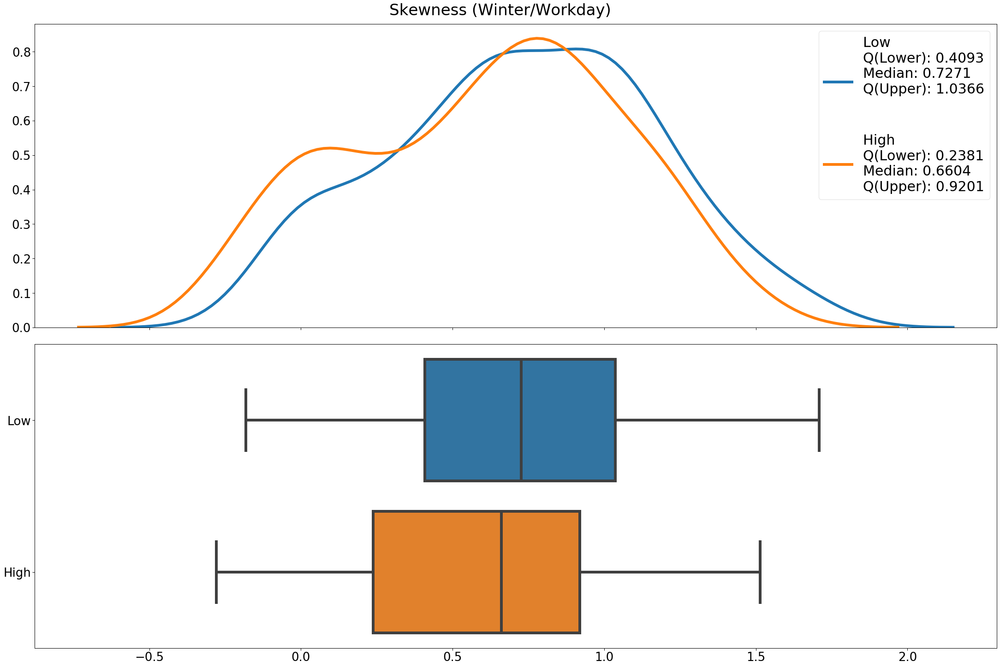

<Figure size 4800x3200 with 0 Axes>

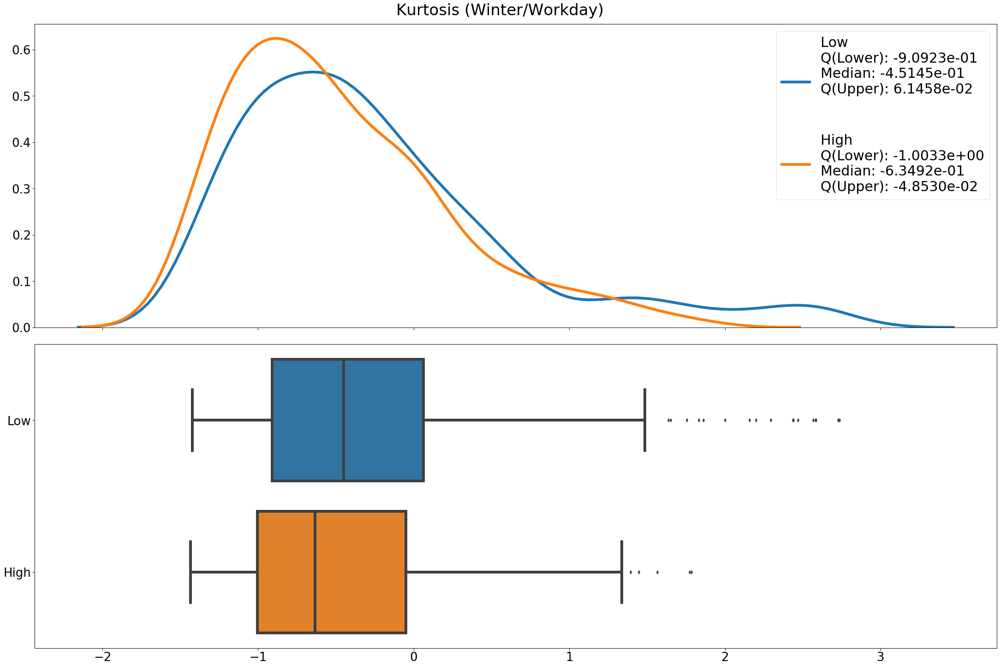

<Figure size 4800x3200 with 0 Axes>

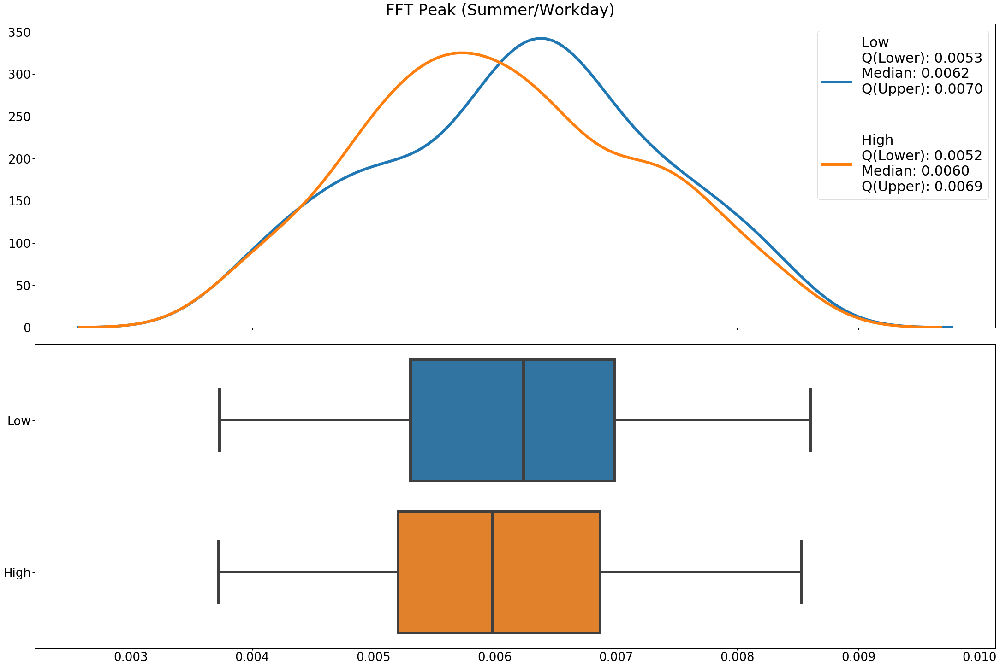

<Figure size 4800x3200 with 0 Axes>

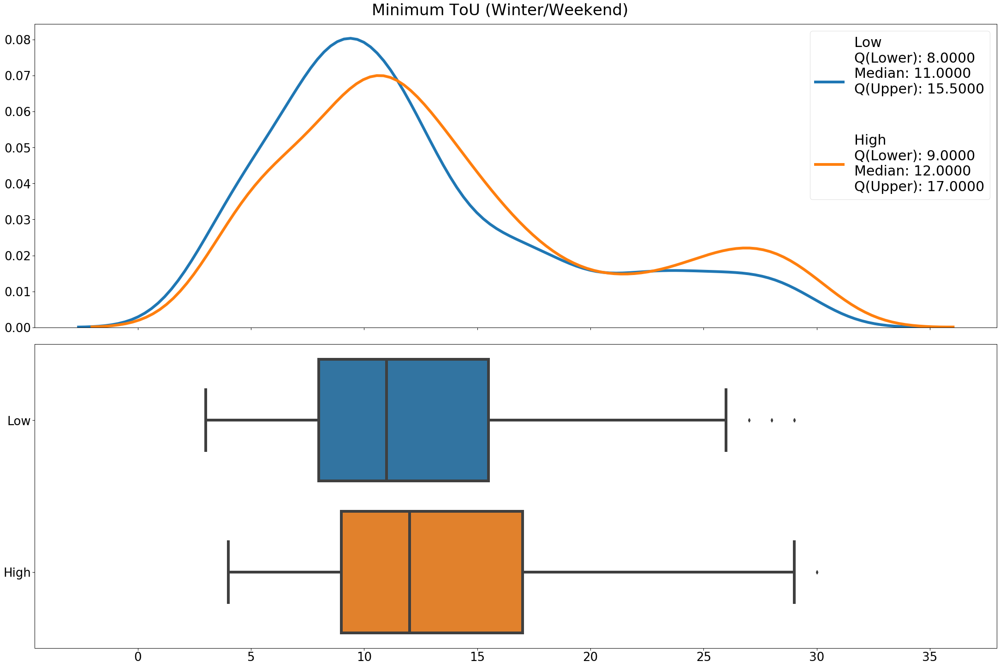

<Figure size 4800x3200 with 0 Axes>

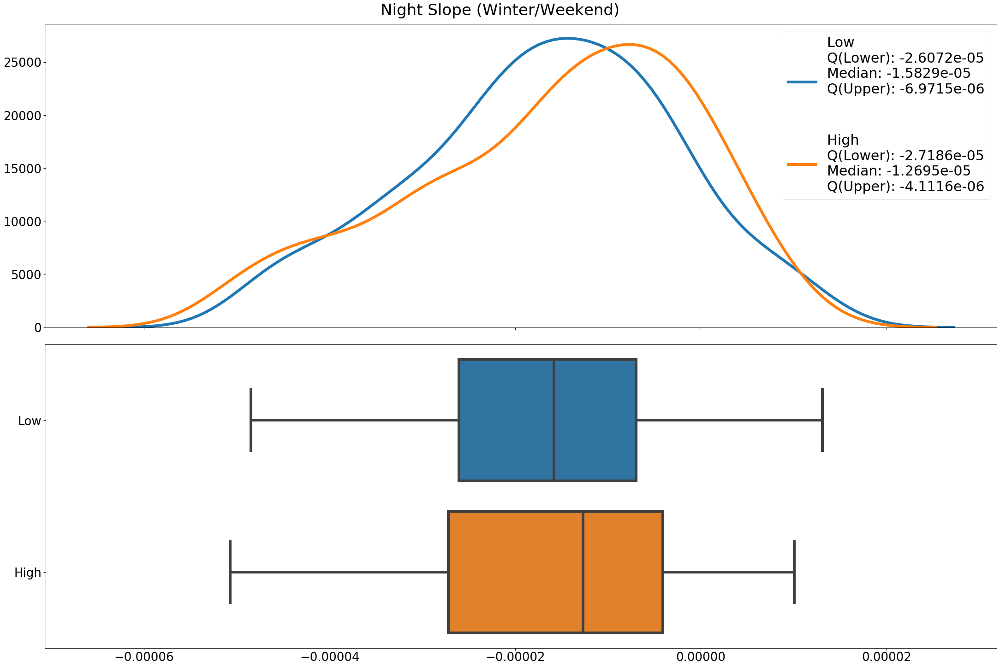

<Figure size 4800x3200 with 0 Axes>

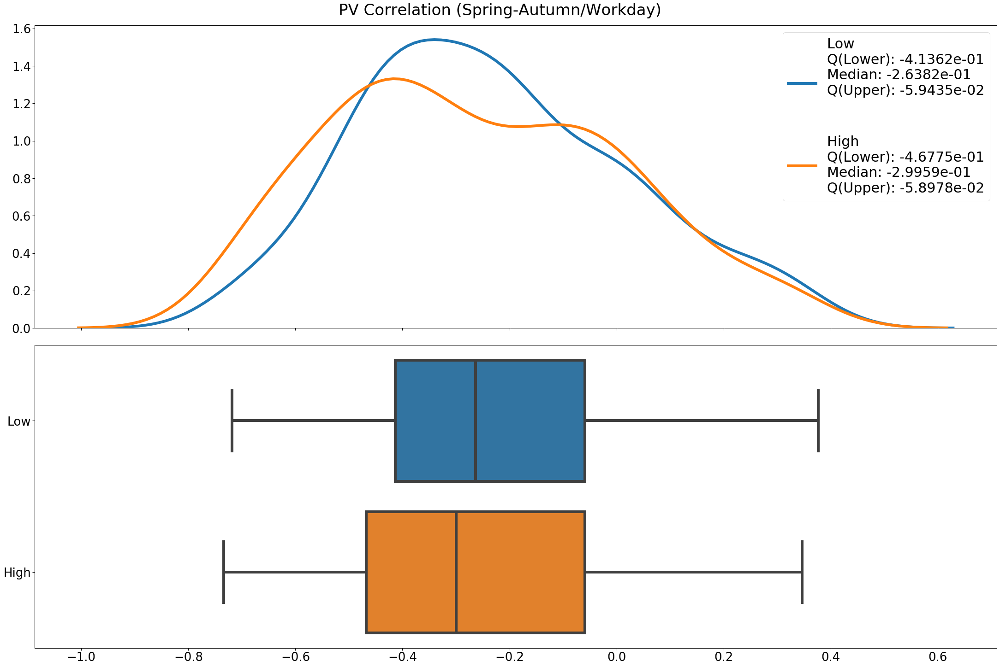

<Figure size 4800x3200 with 0 Axes>

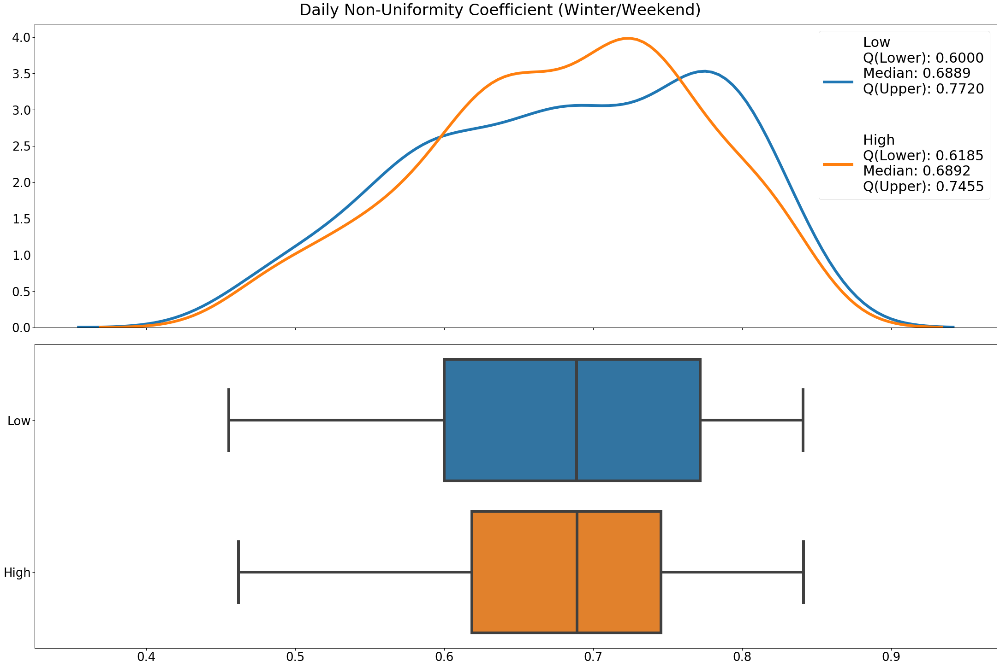

<Figure size 4800x3200 with 0 Axes>

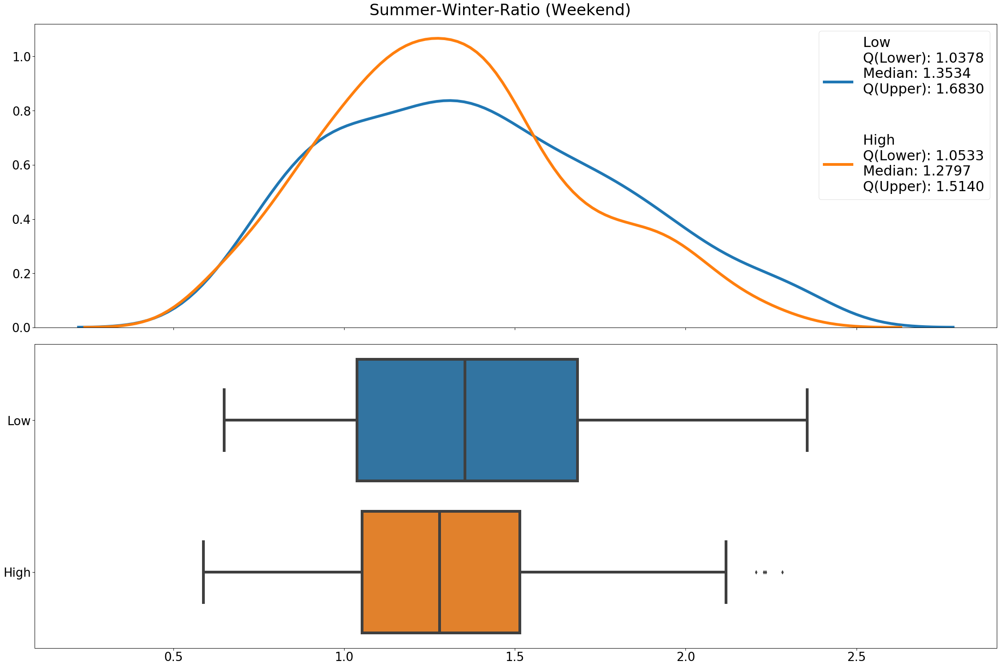

<Figure size 4800x3200 with 0 Axes>

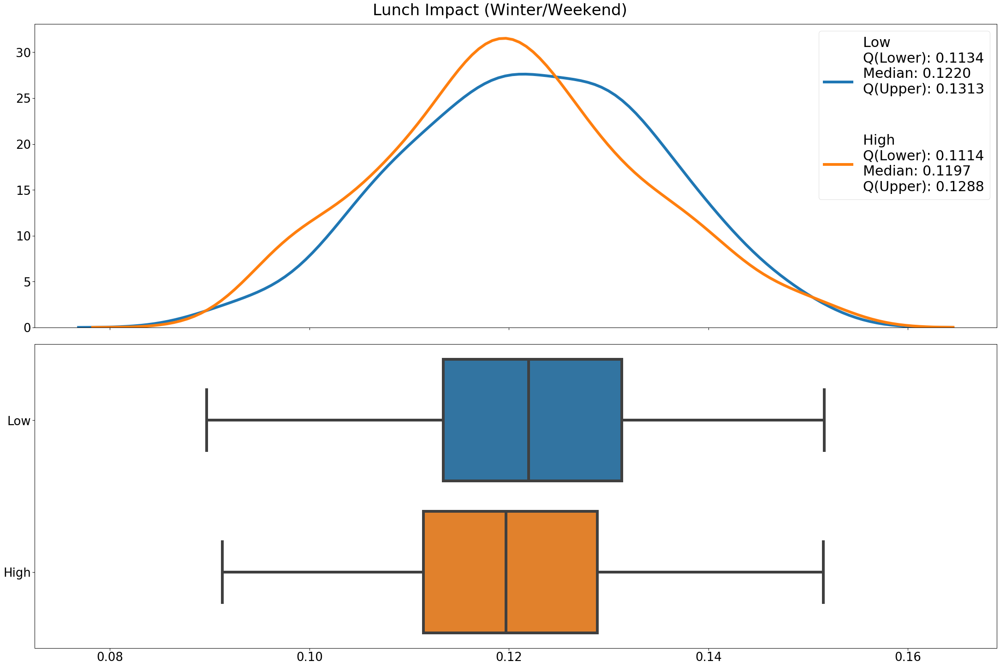

<Figure size 4800x3200 with 0 Axes>

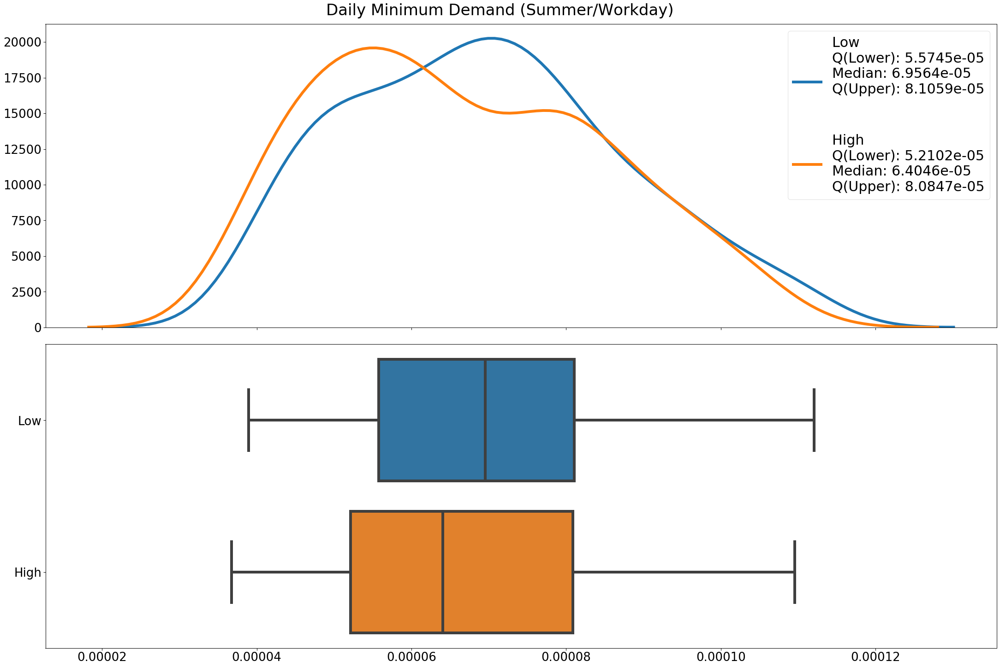

<Figure size 4800x3200 with 0 Axes>

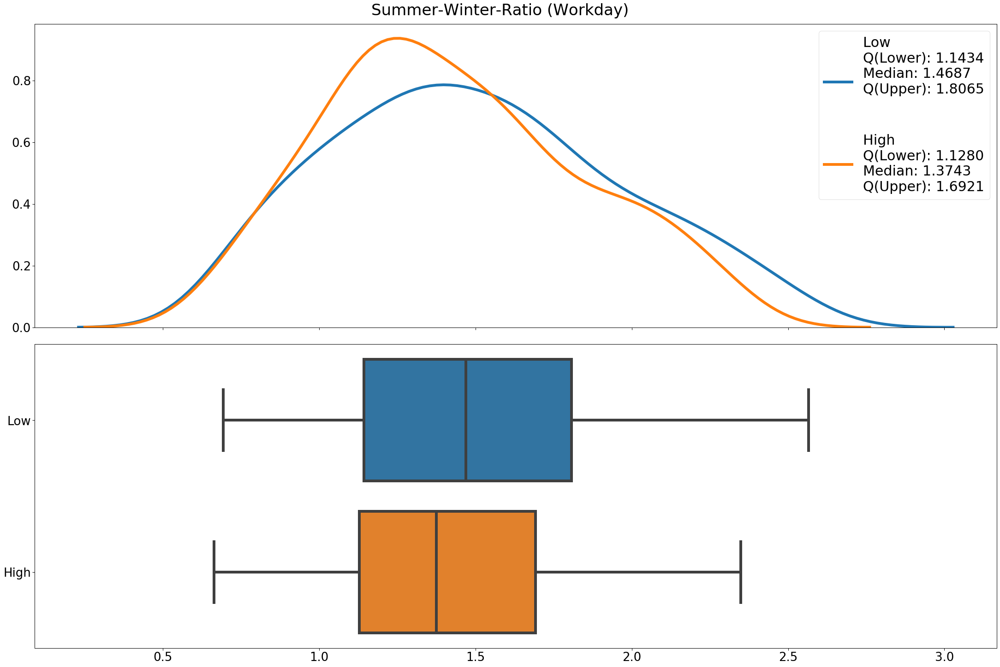

<Figure size 4800x3200 with 0 Axes>

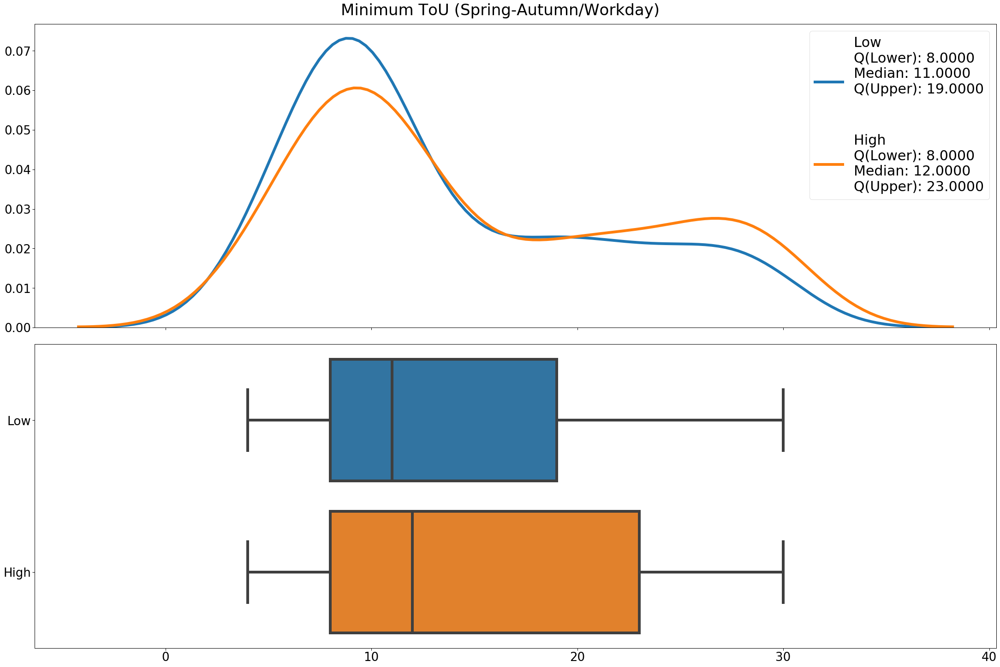

<Figure size 4800x3200 with 0 Axes>

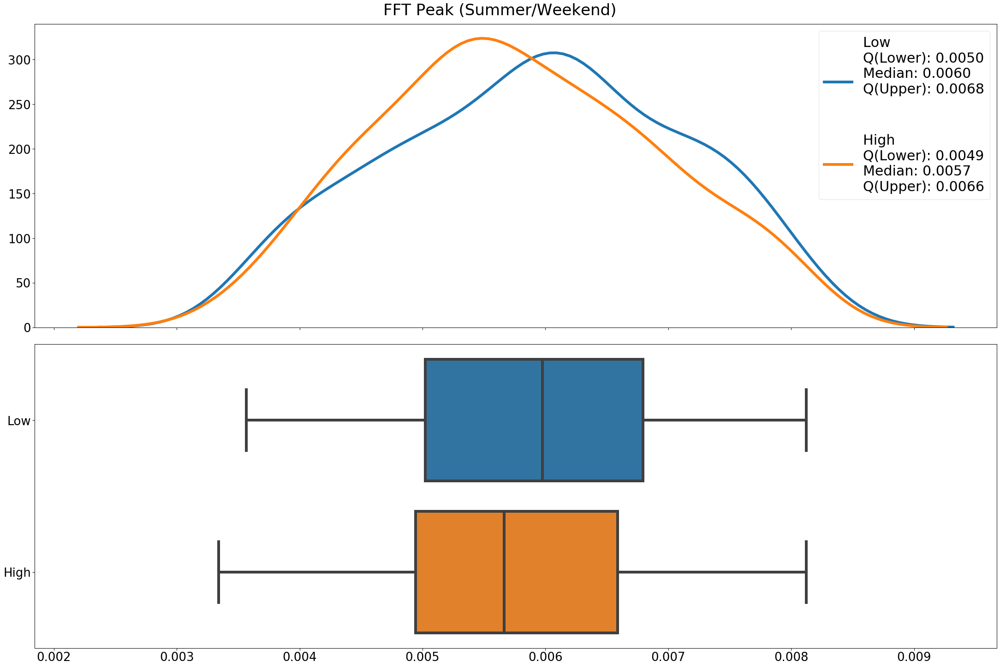

<Figure size 4800x3200 with 0 Axes>

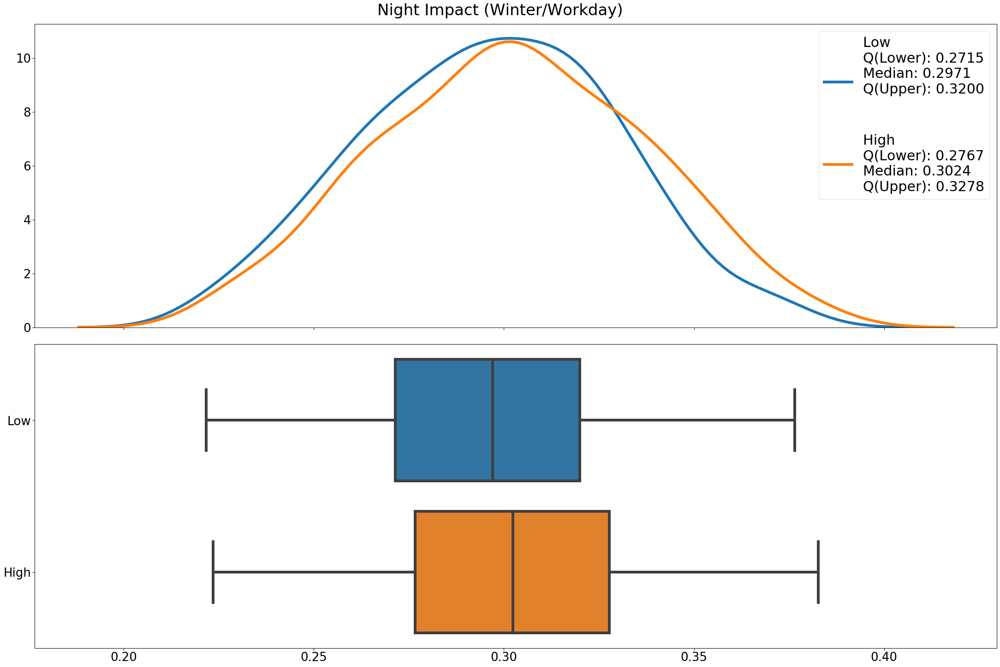

<Figure size 4800x3200 with 0 Axes>

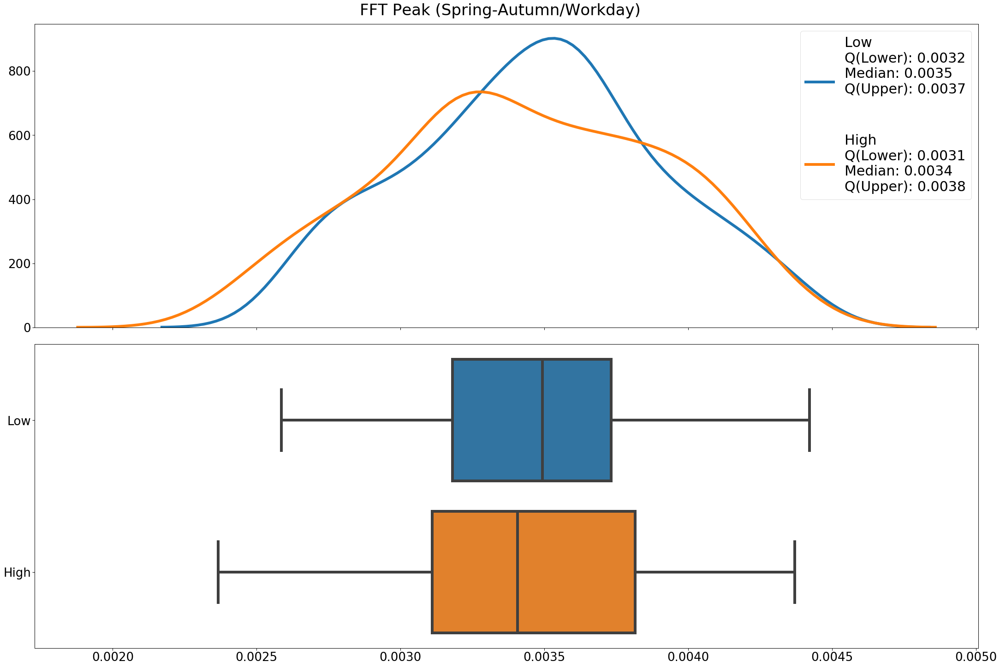

<Figure size 4800x3200 with 0 Axes>

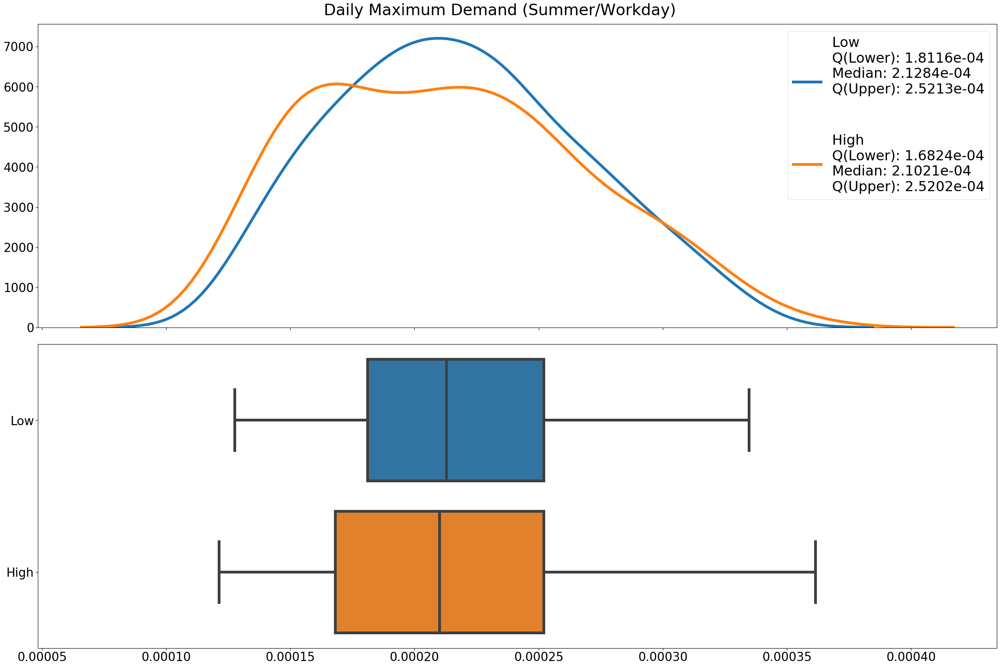

<Figure size 4800x3200 with 0 Axes>

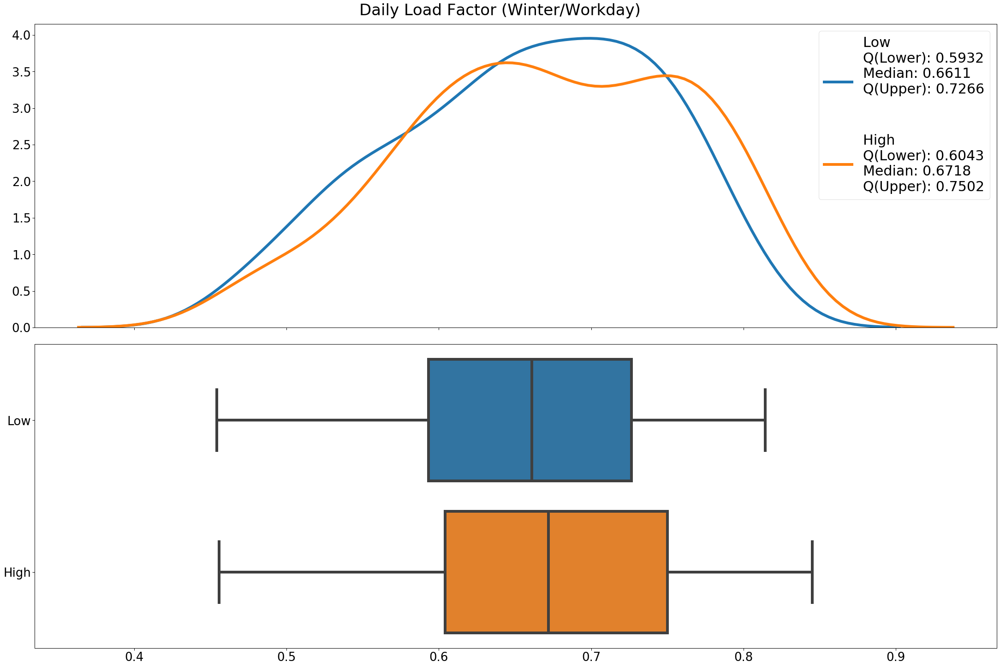

<Figure size 4800x3200 with 0 Axes>

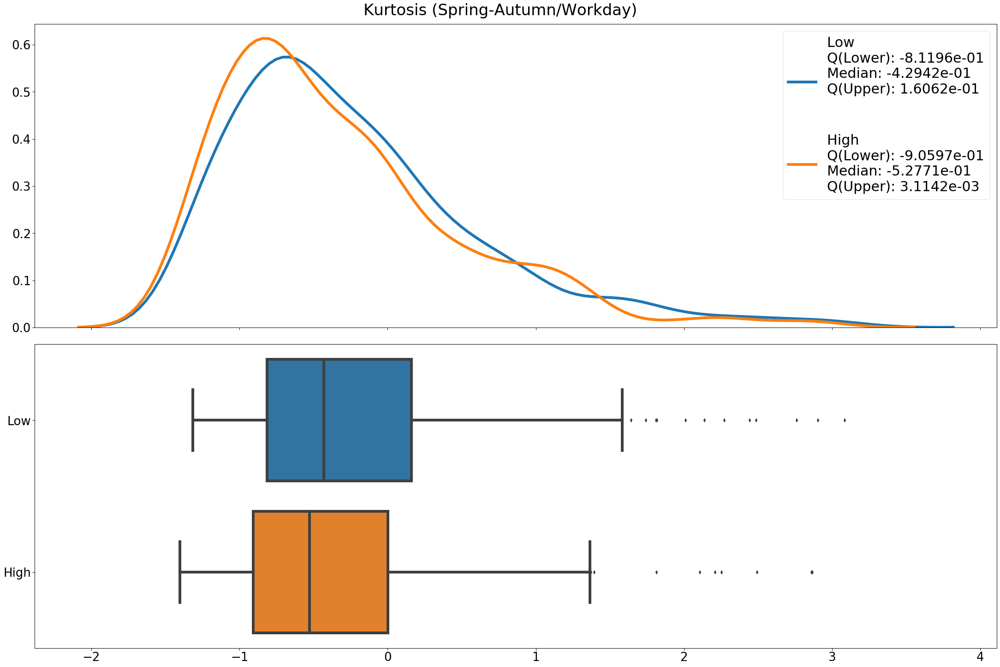

<Figure size 4800x3200 with 0 Axes>

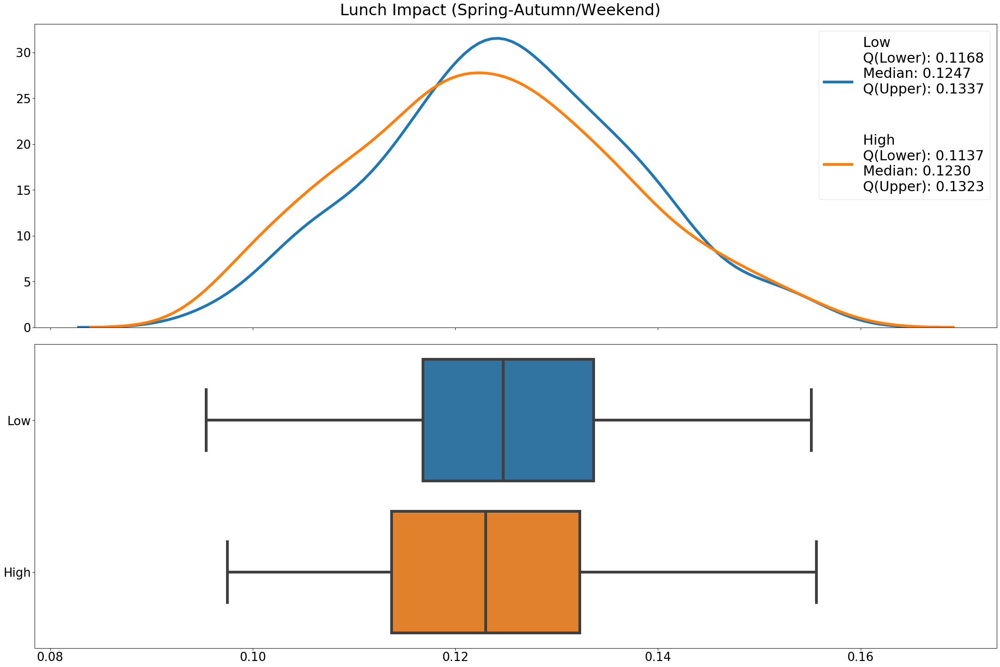

<Figure size 4800x3200 with 0 Axes>

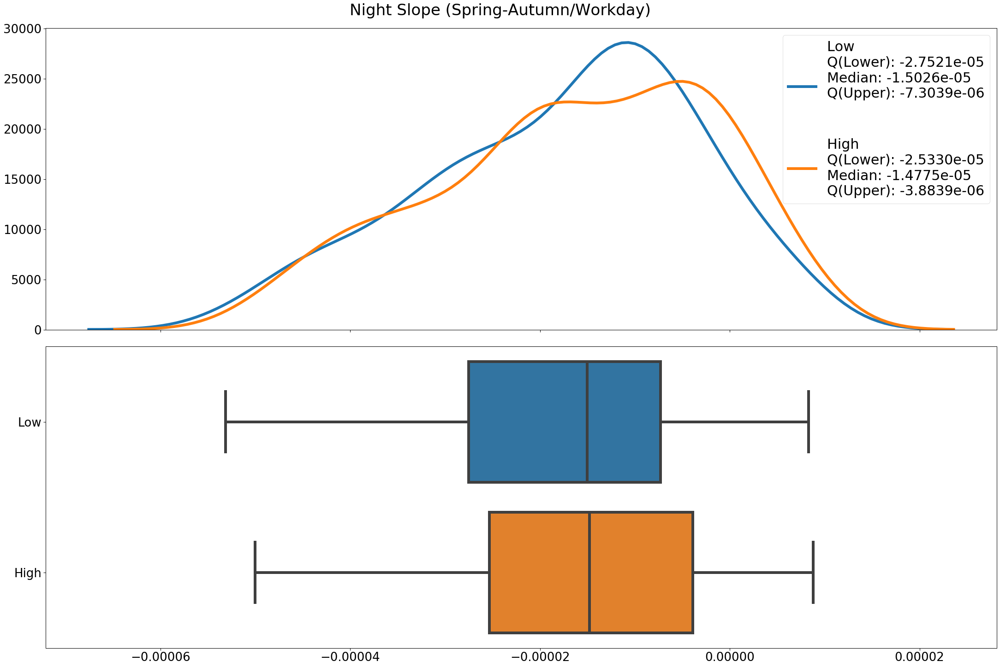

In [259]:
# Import required Python modules
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.offsetbox import AnchoredText

# Import the data
data = pd.read_pickle('Data/Parameter_Values_AFPS_Gain_2020-09-25.pkl')

# Save the parameters selected with the KS test and their corresponding well-formatted title strings in lists to enable iteration 
params = selected_parameters.index.to_list()
param_titles = ['Skewness (Winter/Workday)',
'Kurtosis (Winter/Workday)',
'FFT Peak (Summer/Workday)',
'Minimum ToU (Winter/Weekend)',
'Night Slope (Winter/Weekend)',
'PV Correlation (Spring-Autumn/Workday)',
'Daily Non-Uniformity Coefficient (Winter/Weekend)',
'Summer-Winter-Ratio (Weekend)',
'Lunch Impact (Winter/Weekend)',
'Daily Minimum Demand (Summer/Workday)',
'Summer-Winter-Ratio (Workday)',
'Minimum ToU (Spring-Autumn/Workday)',
'FFT Peak (Summer/Weekend)',
'Night Impact (Winter/Workday)',
'FFT Peak (Spring-Autumn/Workday)',
'Daily Maximum Demand (Summer/Workday)',
'Daily Load Factor (Winter/Workday)',
'Kurtosis (Spring-Autumn/Workday)',
'Lunch Impact (Spring-Autumn/Weekend)',
'Night Slope (Spring-Autumn/Workday)',
'Morning Slope (Summer/Weekend)',
'End-of-Work-Impact (Winter/Weekend)',
'Maximum ToU (Summer/Workday)',
'PV Correlation (Spring-Autumn/Weekend)',
'PV Correlation (Winter/Weekend)',
'Variance (Summer/Workday)']

# Use the utility function defined above to plot the value distributions of the parameters selected with the KS test
for index, parameter, title in zip(range(1,21), params, param_titles):
    plot_parameter_distribution(data, index, parameter, title)